# Disease Liver Classification

In [1]:
#load the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5) # RuntimeConfiguration Parameters: size of graph, 10:width, 5:height
plt.rcParams['figure.dpi'] = 300 # Resolution dots per inches
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Loading Data
df = pd.read_csv("Classification_Project.csv")

In [3]:
df

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
0,no_disease,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69
1,no_disease,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,no_disease,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,no_disease,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,no_disease,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82
613,cirrhosis,46,f,33.0,NaN,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71


In [4]:
# Summary of Numeric Columns
df.describe()

,age,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase
count,615.000000,614.000000,597.000000,614.000000,615.000000,615.000000,615.000000,605.000000,615.000000,615.000000
mean,47.408130,41.620195,68.283920,28.450814,34.786341,11.396748,8.196634,5.368099,81.287805,39.533171
std,10.055105,5.780629,26.028315,25.469689,33.090690,19.673150,2.205657,1.132728,49.756166,54.661071
min,19.000000,14.900000,11.300000,0.900000,10.600000,0.800000,1.420000,1.430000,8.000000,4.500000
25%,39.000000,38.800000,52.500000,16.400000,21.600000,5.300000,6.935000,4.610000,67.000000,15.700000
50%,47.000000,41.950000,66.200000,23.000000,25.900000,7.300000,8.260000,5.300000,77.000000,23.300000
75%,54.000000,45.200000,80.100000,33.075000,32.900000,11.200000,9.590000,6.060000,88.000000,40.200000
max,77.000000,82.200000,416.600000,325.300000,324.000000,254.000000,16.410000,9.670000,1079.100000,650.900000


In [5]:
# Summary of object Columns
df.describe(include = object)

,category,sex,protein
count,615,615,615
unique,5,2,199
top,no_disease,m,71.9
freq,533,377,15


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 615 entries, 0 to 614
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   category                     615 non-null    object 
 1   age                          615 non-null    int64  
 2   sex                          615 non-null    object 
 3   albumin                      614 non-null    float64
 4   alkaline_phosphatase         597 non-null    float64
 5   alanine_aminotransferase     614 non-null    float64
 6   aspartate_aminotransferase   615 non-null    float64
 7   bilirubin                    615 non-null    float64
 8   cholinesterase               615 non-null    float64
 9   cholesterol                  605 non-null    float64
 10  creatinina                   615 non-null    float64
 11  gamma_glutamyl_transferase   615 non-null    float64
 12  protein                      615 non-null    object 
dtypes: float64(9), int64

In [7]:
# 10 Columns are Numeric and 3 Columns are Object
# Null Values are Present In :  albumin & alkaline_phosphatase & alanine_aminotransferase & cholesterol
# These 4 columns which contain null values are Numeric.

# **TREATMENT:**(RETAIN|REPLACE|REMOVE)

## **Removing:**(For NULL Values 0% to 5%: Delete rows or columns with missing data if the percentage is low.

## **Imputing:**(REPLACING) For NULL Values 6% to 45% in Columns: Fill missing values with the mean, median, mode, or use a predictive model.

## **Removing :** For NULL Values 50% or More in Columns: Delete columns with high percentages of missing values, as they may not be reliable.

## **Flagging:** Mark missing values with a specific indicator for analysis


In [8]:
df.isna()

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
0,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,False,False,False,False,False,False,False,False,False,False,False,False,False
611,False,False,False,False,False,False,False,False,False,False,False,False,False
612,False,False,False,False,False,False,False,False,False,False,False,False,False
613,False,False,False,False,True,False,False,False,False,False,False,False,False


In [9]:
df.isna().sum()

category                        0
age                             0
sex                             0
albumin                         1
alkaline_phosphatase           18
alanine_aminotransferase        1
aspartate_aminotransferase      0
bilirubin                       0
cholinesterase                  0
cholesterol                    10
creatinina                      0
gamma_glutamyl_transferase      0
protein                         0
dtype: int64

In [10]:
# Computting Percentage of Null Values:
for i in df.isna().sum():
    print(i/(len(df))*100)

0.0
0.0
0.0
0.16260162601626016
2.9268292682926833
0.16260162601626016
0.0
0.0
0.0
1.6260162601626018
0.0
0.0
0.0


In [11]:
# To see Those Records:
df[df.isnull().any(axis=1)]

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
121,no_disease,43,m,48.6,45.0,10.5,40.5,5.3,7.09,NaN,63.0,25.1,70
319,no_disease,32,f,47.4,52.5,19.1,17.1,4.6,10.19,NaN,63.0,23.0,72.2
329,no_disease,33,f,42.4,137.2,14.2,13.1,3.4,8.23,NaN,48.0,25.7,74.4
413,no_disease,46,f,42.9,55.1,15.2,29.8,3.6,8.37,NaN,61.0,29.0,71.9
424,no_disease,48,f,45.6,107.2,24.4,39.0,13.8,9.77,NaN,88.0,38.0,75.1
433,no_disease,48,f,46.8,93.3,10.0,23.2,4.3,12.41,NaN,52.0,23.9,72.4
498,no_disease,57,f,48.4,94.4,2.5,39.6,2.3,8.84,NaN,82.0,6.4,76.8
540,hepatitis,38,m,45.0,56.3,NaN,33.1,7.0,9.58,6.0,77.9,18.9,63
541,hepatitis,19,m,41.0,NaN,87.0,67.0,12.0,7.55,3.9,62.0,65.0,75
545,hepatitis,29,m,49.0,NaN,53.0,39.0,15.0,8.79,3.6,79.0,37.0,90


# **TO SAVE DATA I WOULD LIKE TO DO IMPUTATION :**


**CHECKING FOR OUTLIER IN THOSE COLUMNS :**
**albumin | alkaline_phosphatase | alanine_aminotransferase | cholesterol**

In [12]:
import plotly.express as px
px.box(df, x = ['albumin','alkaline_phosphatase','alanine_aminotransferase','cholesterol'])
# Yeah all 4 columns contain outliers
# So I can impute null values with median....

In [13]:
# IMPUTING NULL VALUES WITH MEDIAN :
df["albumin"].fillna(df["albumin"].median(),inplace=True)
df["alkaline_phosphatase"].fillna(df["alkaline_phosphatase"].median(),inplace=True)
df["alanine_aminotransferase"].fillna(df["alanine_aminotransferase"].median(),inplace=True)
df["cholesterol"].fillna(df["cholesterol"].median(),inplace=True)

In [14]:
# Rechecking For Null Values :
df.isna().sum()

category                       0
age                            0
sex                            0
albumin                        0
alkaline_phosphatase           0
alanine_aminotransferase       0
aspartate_aminotransferase     0
bilirubin                      0
cholinesterase                 0
cholesterol                    0
creatinina                     0
gamma_glutamyl_transferase     0
protein                        0
dtype: int64

# DATA TYPE CORRECTION

In [15]:
df.dtypes

category                        object
age                              int64
sex                             object
albumin                        float64
alkaline_phosphatase           float64
alanine_aminotransferase       float64
aspartate_aminotransferase     float64
bilirubin                      float64
cholinesterase                 float64
cholesterol                    float64
creatinina                     float64
gamma_glutamyl_transferase     float64
protein                         object
dtype: object

In [16]:
# HERE IF CHECK MY DATA  THE PROTEIN COLUMN CONTAIN FLOAT VALUES
# BUT THE PROTEIN COLUMNS DATATYPE IS SHOWED AS OBJECT :

In [17]:
df.columns

Index(['category', 'age', 'sex', 'albumin', 'alkaline_phosphatase',
       'alanine_aminotransferase', 'aspartate_aminotransferase', 'bilirubin',
       'cholinesterase', 'cholesterol', 'creatinina',
       'gamma_glutamyl_transferase ', 'protein   '],
      dtype='object')

In [18]:
# To check Unique values of PROTEIN Columns :


In [19]:
df["protein   "].unique()

array(['69', '76.5', '79.3', '75.7', '68.7', '74', '74.5', '67.1', '71.3',
       '69.9', '75.4', '68.6', '70.4', '71.9', '72.7', '72.4', '69.3',
       '68.1', '74.3', '69.1', '69.6', '72', '78.9', '67.7', '53.2',
       '73.1', '78.7', '71', '73.6', '77.1', '75.8', '77.8', '67.2',
       '77.3', '80.7', '79.6', '71.6', '70.8', '73.4', '76.2', '73.8',
       '79.9', '72.3', '80.6', '72.5', '56.3', '76.3', '71.5', '75',
       '74.7', '75.2', '75.1', '76.1', '73.9', '67.4', '70.1', '66.7',
       '82.6', '75.6', '71.2', '77.2', '78.4', '66.3', '66.2', '70.5',
       '72.2', '75.5', '71.1', '74.1', '68.8', '81.1', '76.6', '75.3',
       '64.1', '73.3', '83.4', '72.1', '73', '71.8', '77.5', '68.4',
       '80.3', '74.2', '70', '72.9', '76.9', '76.8', '70.9', '68', '63.4',
       '69.2', '70.6', '66.6', '70.3', '78.8', '73.7', '62.1', '65',
       '79.8', '70.2', '73.2', '66.4', '69.5', '68.3', '78', '82.1',
       '81.5', '74.9', '66.8', '68.9', '83.3', '69.8', '65.4', '71.4',
       '79

In [20]:
df[df["protein   "]=="NA    "]

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
590,cirrhosis,46,m,20.0,66.2,62.0,113.0,254.0,1.48,5.3,114.0,138.0,NA


In [21]:
# replacing that na with zero:
df["protein   "]=df["protein   "].replace("NA    ","0")

In [22]:
# RESETING INDEX OF DATA:
df.reset_index(drop=True,inplace=True)

In [23]:
# now changing datatype of protien column:
df["protein   "]=df["protein   "].astype("float64")

In [24]:
df.dtypes

category                        object
age                              int64
sex                             object
albumin                        float64
alkaline_phosphatase           float64
alanine_aminotransferase       float64
aspartate_aminotransferase     float64
bilirubin                      float64
cholinesterase                 float64
cholesterol                    float64
creatinina                     float64
gamma_glutamyl_transferase     float64
protein                        float64
dtype: object

In [25]:
df

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
0,no_disease,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,no_disease,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,no_disease,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,no_disease,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,no_disease,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,cirrhosis,46,f,33.0,66.2,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


In [26]:
df.isna().sum()

category                       0
age                            0
sex                            0
albumin                        0
alkaline_phosphatase           0
alanine_aminotransferase       0
aspartate_aminotransferase     0
bilirubin                      0
cholinesterase                 0
cholesterol                    0
creatinina                     0
gamma_glutamyl_transferase     0
protein                        0
dtype: int64

# OUTLIER DETECTION

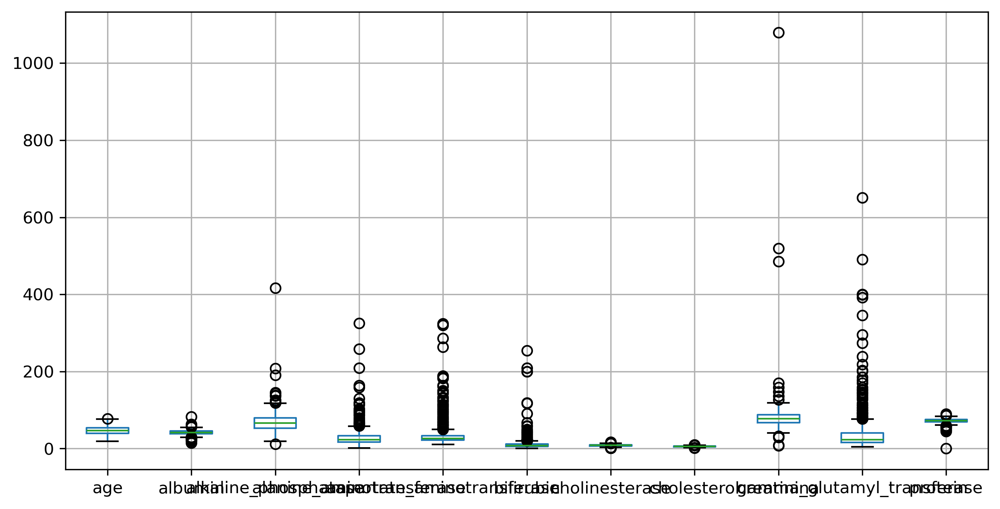

In [27]:
import matplotlib.pyplot as plt
df.boxplot()
plt.show()

In [28]:
# ALL COLUMNS COATAIN OUTLIERS ...

In [29]:
import numpy as np

def datalu(df):
    for a in df.select_dtypes(include='number').columns:
        uq = df[a].quantile(0.75)
        lq = df[a].quantile(0.25)
        iqr = uq - lq

        upper_extreme = uq + (1.5 * iqr)
        lower_extreme = lq - (1.5 * iqr)

        print(f"Upper extreme of {a}: {upper_extreme}")
        print(f"Lower extreme of {a}: {lower_extreme}")

        # Outlier capping
        df[a] = np.where(df[a] < lower_extreme, lower_extreme,
                           np.where(df[a] > upper_extreme, upper_extreme, df[a]))

In [30]:
datalu(df)

Upper extreme of age: 76.5
Lower extreme of age: 16.5
Upper extreme of albumin: 54.80000000000001
Lower extreme of albumin: 29.19999999999999
Upper extreme of alkaline_phosphatase: 118.82499999999999
Lower extreme of alkaline_phosphatase: 13.425000000000011
Upper extreme of alanine_aminotransferase: 58.02499999999999
Lower extreme of alanine_aminotransferase: -8.575
Upper extreme of aspartate_aminotransferase: 49.849999999999994
Lower extreme of aspartate_aminotransferase: 4.650000000000006
Upper extreme of bilirubin: 20.049999999999997
Lower extreme of bilirubin: -3.55
Upper extreme of cholinesterase: 13.572499999999998
Lower extreme of cholinesterase: 2.9525000000000015
Upper extreme of cholesterol: 8.2075
Lower extreme of cholesterol: 2.4675000000000007
Upper extreme of creatinina: 119.5
Lower extreme of creatinina: 35.5
Upper extreme of gamma_glutamyl_transferase : 76.95000000000002
Lower extreme of gamma_glutamyl_transferase : -21.050000000000008
Upper extreme of protein   : 84.55

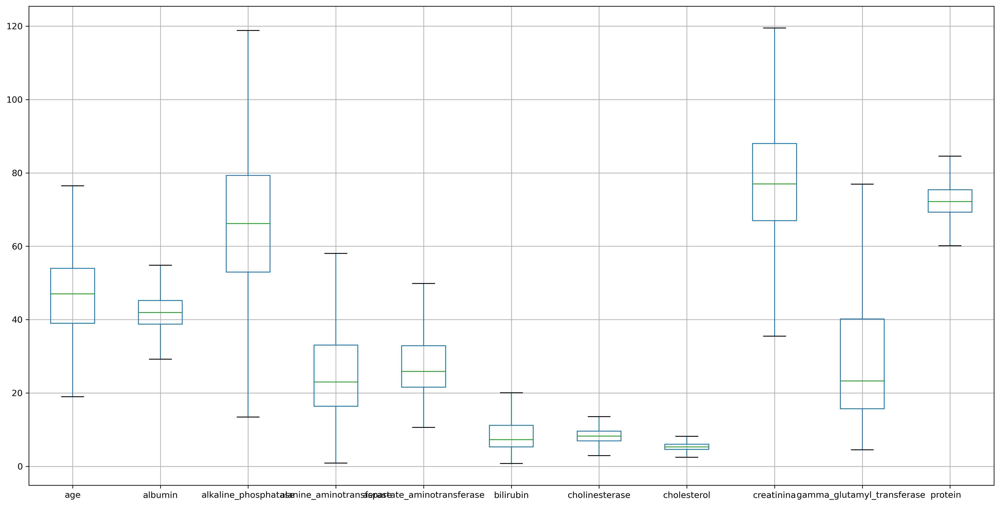

In [31]:
plt.figure(figsize=(20,10))
df.boxplot()
plt.show()

In [32]:
# NOW THERE IS NO OUTLIERS

# **Scatter Plot and Correlation**

In [33]:
df

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
0,no_disease,32.0,m,38.5,52.500,7.700,22.10,7.50,6.9300,3.23,106.0,12.10,69.0
1,no_disease,32.0,m,38.5,70.300,18.000,24.70,3.90,11.1700,4.80,74.0,15.60,76.5
2,no_disease,32.0,m,46.9,74.700,36.200,49.85,6.10,8.8400,5.20,86.0,33.20,79.3
3,no_disease,32.0,m,43.2,52.000,30.600,22.60,18.90,7.3300,4.74,80.0,33.80,75.7
4,no_disease,32.0,m,39.2,74.100,32.600,24.80,9.60,9.1500,4.32,76.0,29.90,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,cirrhosis,62.0,f,32.0,118.825,5.900,49.85,20.05,5.5700,6.30,55.7,76.95,68.5
611,cirrhosis,64.0,f,29.2,102.800,2.900,44.40,20.00,2.9525,3.02,63.0,35.90,71.3
612,cirrhosis,64.0,f,29.2,87.300,3.500,49.85,20.05,2.9525,3.63,66.7,64.20,82.0
613,cirrhosis,46.0,f,33.0,66.200,39.000,49.85,20.00,3.5600,4.20,52.0,50.00,71.0


In [34]:
import seaborn as sns

In [35]:
sns.pairplot(df)
plt.show()

In [36]:
#Correlation Coefficient
df.corr(numeric_only=True)

,age,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
age,1.000000,-0.192786,0.173501,-0.071437,0.072680,0.020185,-0.072111,0.132178,-0.029495,0.121822,-0.135276
albumin,-0.192786,1.000000,-0.089633,0.160969,-0.089543,0.015630,0.383440,0.189065,0.230130,-0.056312,0.538942
alkaline_phosphatase,0.173501,-0.089633,1.000000,0.172880,-0.003836,-0.082243,0.093550,0.144713,0.056884,0.150934,-0.005588
alanine_aminotransferase,-0.071437,0.160969,0.172880,1.000000,0.426765,0.088183,0.283943,0.161518,0.205540,0.391095,0.190189
aspartate_aminotransferase,0.072680,-0.089543,-0.003836,0.426765,1.000000,0.385570,-0.037927,-0.149159,0.067369,0.526644,0.112139
bilirubin,0.020185,0.015630,-0.082243,0.088183,0.385570,1.000000,-0.157151,-0.171963,0.177176,0.241096,0.108624
cholinesterase,-0.072111,0.383440,0.093550,0.283943,-0.037927,-0.157151,1.000000,0.422414,0.146900,0.028233,0.303531
cholesterol,0.132178,0.189065,0.144713,0.161518,-0.149159,-0.171963,0.422414,1.000000,0.043333,0.043038,0.176753
creatinina,-0.029495,0.230130,0.056884,0.205540,0.067369,0.177176,0.146900,0.043333,1.000000,0.141544,0.112552
gamma_glutamyl_transferase,0.121822,-0.056312,0.150934,0.391095,0.526644,0.241096,0.028233,0.043038,0.141544,1.000000,0.100445


In [37]:
# LOW CORRELATION IS AVAILABLE BETWEEN VARIABLES

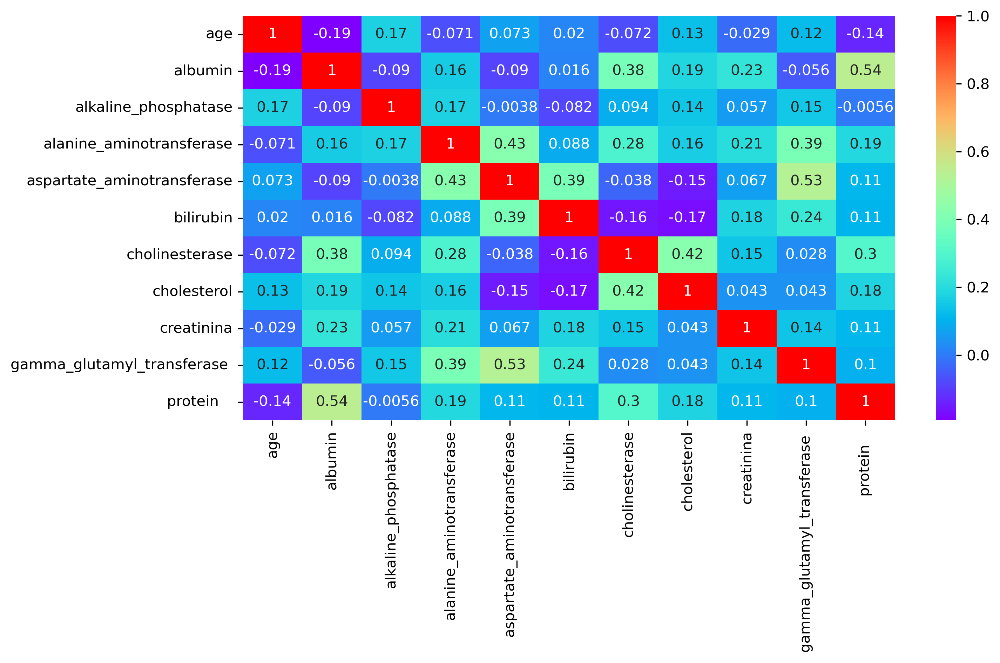

In [38]:
sns.heatmap(df.corr(numeric_only=True),annot = True, cmap = 'rainbow')
plt.show()

# Scaling the data

In [39]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler,RobustScaler

In [40]:
sc =RobustScaler()

In [41]:
df.columns

Index(['category', 'age', 'sex', 'albumin', 'alkaline_phosphatase',
       'alanine_aminotransferase', 'aspartate_aminotransferase', 'bilirubin',
       'cholinesterase', 'cholesterol', 'creatinina',
       'gamma_glutamyl_transferase ', 'protein   '],
      dtype='object')

In [42]:
sc.fit_transform(df.select_dtypes(include="number"))

array([[-1.        , -0.5390625 , -0.5199241 , ...,  1.38095238,
        -0.45714286, -0.52459016],
       [-1.        , -0.5390625 ,  0.15559772, ..., -0.14285714,
        -0.31428571,  0.70491803],
       [-1.        ,  0.7734375 ,  0.32258065, ...,  0.42857143,
         0.40408163,  1.16393443],
       ...,
       [ 1.13333333, -1.9921875 ,  0.80075901, ..., -0.49047619,
         1.66938776,  1.60655738],
       [-0.06666667, -1.3984375 ,  0.        , ..., -1.19047619,
         1.08979592, -0.19672131],
       [ 0.8       , -0.9296875 ,  0.        , ..., -0.47619048,
         0.43673469, -0.68852459]])

In [43]:
df = pd.get_dummies(data=df, columns =['sex'])

In [44]:
x = sc.fit_transform(df.select_dtypes(include="number"))

In [45]:

# Apply logarithmic transformation
# x= df.select_dtypes(include="number").applymap(lambda x: np.log(x) if x > 0 else None)

In [46]:
from sklearn.preprocessing import LabelEncoder

# Initiating encoder
le = LabelEncoder()

# Example of encoding a single column
df['category'] = le.fit_transform(df['category'])

In [47]:
df

,category,age,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein,sex_f,sex_m
0,3,32.0,38.5,52.500,7.700,22.10,7.50,6.9300,3.23,106.0,12.10,69.0,False,True
1,3,32.0,38.5,70.300,18.000,24.70,3.90,11.1700,4.80,74.0,15.60,76.5,False,True
2,3,32.0,46.9,74.700,36.200,49.85,6.10,8.8400,5.20,86.0,33.20,79.3,False,True
3,3,32.0,43.2,52.000,30.600,22.60,18.90,7.3300,4.74,80.0,33.80,75.7,False,True
4,3,32.0,39.2,74.100,32.600,24.80,9.60,9.1500,4.32,76.0,29.90,68.7,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,0,62.0,32.0,118.825,5.900,49.85,20.05,5.5700,6.30,55.7,76.95,68.5,True,False
611,0,64.0,29.2,102.800,2.900,44.40,20.00,2.9525,3.02,63.0,35.90,71.3,True,False
612,0,64.0,29.2,87.300,3.500,49.85,20.05,2.9525,3.63,66.7,64.20,82.0,True,False
613,0,46.0,33.0,66.200,39.000,49.85,20.00,3.5600,4.20,52.0,50.00,71.0,True,False


In [48]:
# Encoding the 'category' column
df["encoded_y"] = le.fit_transform(df["category"])


In [49]:
y = df["encoded_y"]

In [50]:
y

0      3
1      3
2      3
3      3
4      3
      ..
610    0
611    0
612    0
613    0
614    0
Name: encoded_y, Length: 615, dtype: int64

In [51]:
df

,category,age,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein,sex_f,sex_m,encoded_y
0,3,32.0,38.5,52.500,7.700,22.10,7.50,6.9300,3.23,106.0,12.10,69.0,False,True,3
1,3,32.0,38.5,70.300,18.000,24.70,3.90,11.1700,4.80,74.0,15.60,76.5,False,True,3
2,3,32.0,46.9,74.700,36.200,49.85,6.10,8.8400,5.20,86.0,33.20,79.3,False,True,3
3,3,32.0,43.2,52.000,30.600,22.60,18.90,7.3300,4.74,80.0,33.80,75.7,False,True,3
4,3,32.0,39.2,74.100,32.600,24.80,9.60,9.1500,4.32,76.0,29.90,68.7,False,True,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,0,62.0,32.0,118.825,5.900,49.85,20.05,5.5700,6.30,55.7,76.95,68.5,True,False,0
611,0,64.0,29.2,102.800,2.900,44.40,20.00,2.9525,3.02,63.0,35.90,71.3,True,False,0
612,0,64.0,29.2,87.300,3.500,49.85,20.05,2.9525,3.63,66.7,64.20,82.0,True,False,0
613,0,46.0,33.0,66.200,39.000,49.85,20.00,3.5600,4.20,52.0,50.00,71.0,True,False,0


# DIVINDING DATA INTO TRAINING AND TESTING DATASET

In [52]:
# already assigned x and y
x

array([[-1.        , -0.5390625 , -0.5199241 , ...,  1.38095238,
        -0.45714286, -0.52459016],
       [-1.        , -0.5390625 ,  0.15559772, ..., -0.14285714,
        -0.31428571,  0.70491803],
       [-1.        ,  0.7734375 ,  0.32258065, ...,  0.42857143,
         0.40408163,  1.16393443],
       ...,
       [ 1.13333333, -1.9921875 ,  0.80075901, ..., -0.49047619,
         1.66938776,  1.60655738],
       [-0.06666667, -1.3984375 ,  0.        , ..., -1.19047619,
         1.08979592, -0.19672131],
       [ 0.8       , -0.9296875 ,  0.        , ..., -0.47619048,
         0.43673469, -0.68852459]])

In [53]:
y

0      3
1      3
2      3
3      3
4      3
      ..
610    0
611    0
612    0
613    0
614    0
Name: encoded_y, Length: 615, dtype: int64

In [54]:
x

array([[-1.        , -0.5390625 , -0.5199241 , ...,  1.38095238,
        -0.45714286, -0.52459016],
       [-1.        , -0.5390625 ,  0.15559772, ..., -0.14285714,
        -0.31428571,  0.70491803],
       [-1.        ,  0.7734375 ,  0.32258065, ...,  0.42857143,
         0.40408163,  1.16393443],
       ...,
       [ 1.13333333, -1.9921875 ,  0.80075901, ..., -0.49047619,
         1.66938776,  1.60655738],
       [-0.06666667, -1.3984375 ,  0.        , ..., -1.19047619,
         1.08979592, -0.19672131],
       [ 0.8       , -0.9296875 ,  0.        , ..., -0.47619048,
         0.43673469, -0.68852459]])

In [55]:
y


0      3
1      3
2      3
3      3
4      3
      ..
610    0
611    0
612    0
613    0
614    0
Name: encoded_y, Length: 615, dtype: int64

In [56]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.2, random_state = 42)

In [57]:
xtrain

array([[-0.53333333, -0.8359375 ,  0.19354839, ...,  0.        ,
        -0.02857143, -0.96721311],
       [-0.53333333,  0.6015625 , -0.14041746, ...,  0.        ,
        -0.30204082,  0.54098361],
       [ 0.4       ,  0.3984375 , -0.18975332, ..., -0.33333333,
        -0.20408163, -0.03278689],
       ...,
       [ 0.8       , -0.3359375 , -0.63757116, ...,  0.42857143,
        -0.1877551 , -0.04918033],
       [ 0.06666667,  0.3828125 , -0.5199241 , ..., -0.14285714,
        -0.53061224,  0.14754098],
       [-0.4       ,  0.0546875 , -0.39089184, ...,  0.42857143,
         0.04897959,  0.63934426]])

In [58]:
ytrain

83     3
90     3
228    3
509    3
329    3
      ..
71     3
106    3
270    3
435    3
102    3
Name: encoded_y, Length: 492, dtype: int64

In [59]:
xtest

array([[ 0.53333333, -1.9921875 , -0.02656546, ..., -0.57142857,
         0.11836735, -1.60655738],
       [-0.53333333, -1.6484375 ,  1.51043643, ..., -0.42857143,
        -0.01632653,  0.01639344],
       [ 0.06666667,  0.2734375 , -0.61100569, ..., -0.61904762,
        -0.40408163,  0.14754098],
       ...,
       [ 0.53333333, -0.0703125 , -0.25426945, ...,  0.14285714,
        -0.44489796, -0.37704918],
       [-0.93333333,  0.6953125 ,  0.07590133, ...,  0.0952381 ,
        -0.1877551 , -0.59016393],
       [-0.86666667, -0.0078125 , -0.71347249, ...,  0.95238095,
        -0.49387755, -0.04918033]])

In [60]:
ytest

248    3
365    3
432    3
610    0
132    3
      ..
281    3
291    3
250    3
11     3
336    3
Name: encoded_y, Length: 123, dtype: int64

# Model Building

# Random Forest Classifier

In [61]:
# Importing Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

In [62]:
RF = RandomForestClassifier()

# Fit Training Data
RF.fit(xtrain, ytrain)

RandomForestClassifier()

In [63]:
# Training Accuracy
RF.score(xtrain,ytrain)

1.0

In [64]:
RF.score(xtest,ytest)

0.8780487804878049

In [65]:
y_pred = RF.predict(xtest)

In [66]:
y_pred

array([3, 3, 3, 0, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       0, 3, 2, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 3, 3, 3, 1, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 2, 3, 1, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3], dtype=int64)

In [67]:
# Testing Accuracy

In [68]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
print("precision score=", precision_score(ytest,y_pred,average="weighted"))
print("recall score=", recall_score(ytest,y_pred,average ="weighted"))
print("f1 score=", f1_score(ytest,y_pred, average ="weighted"))


precision score= 0.8579743180609375
recall score= 0.8780487804878049
f1 score= 0.8475819106601277


# Logistic Regression Model

In [69]:
from sklearn.linear_model import LogisticRegression

In [70]:
lr = LogisticRegression()
lr.fit(xtrain,ytrain)

LogisticRegression()

In [71]:
# Trainig Accuracy
lr.score(xtrain,ytrain)

0.9634146341463414

In [72]:
lr.score(xtest,ytest)

0.9024390243902439

In [73]:
# For Model Testing: Computing YHat for Test Data
y_pred = lr.predict(xtest)

In [74]:
y_pred

array([3, 3, 3, 0, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3,
       0, 3, 2, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 0, 3, 3, 3, 1, 3, 1,
       3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3,
       3, 0, 3, 3, 3, 3, 4, 3, 0, 3, 3, 3, 3, 3, 3, 2, 3, 1, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3], dtype=int64)

In [75]:
# TESTING ACCURACY :
print("pricision score =", precision_score(ytest,y_pred,average="weighted"))
print(" recall score =", recall_score(ytest,y_pred,average="weighted"))
print("f1 score = ",f1_score(ytest,y_pred,average="weighted"))

pricision score = 0.9178423401881076
 recall score = 0.9024390243902439
f1 score =  0.8918916568844832


# Decision tree Classifier Model

In [76]:
from sklearn.tree import DecisionTreeClassifier


In [77]:
dt = DecisionTreeClassifier()
dt.fit(xtrain, ytrain)

DecisionTreeClassifier()

In [78]:
# Training Accuracy
dt.score(xtrain,ytrain)

1.0

In [79]:
dt.score(xtest,ytest)

0.8292682926829268

In [80]:
# COMPUTING Y_PRED:
y_pred = dt.predict(xtest)

In [81]:
y_pred

array([3, 3, 3, 0, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       2, 3, 2, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 1, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 2, 0, 3, 2, 3, 1, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 1, 3, 1, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3], dtype=int64)

In [82]:
#Testing Accuracy
print("precision score=", precision_score(ytest,y_pred, average = "weighted"))
print("recall score=", recall_score(ytest,y_pred, average="weighted"))
print("f1 score=", f1_score(ytest,y_pred, average = "weighted"))

precision score= 0.7955865272938444
recall score= 0.8292682926829268
f1 score= 0.8050224542226513


# SVM Model

In [83]:
from sklearn.svm import SVC

In [84]:
sv = SVC()
sv.fit(xtrain,ytrain)

SVC()

In [85]:
# Training Accuracy
sv.score(xtrain,ytrain)

0.9735772357723578

In [86]:
sv.score(xtest,ytest)

0.8373983739837398

In [87]:
# COMPUTING Y_PRED:
y_pred = sv.predict(xtest)

In [88]:
y_pred

array([3, 3, 3, 0, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3], dtype=int64)

In [89]:
#Testing Accuracy
print("precision score=", precision_score(ytest,y_pred, average = "weighted"))
print("recall score=", recall_score(ytest,y_pred, average="weighted"))
print("f1 score=", f1_score(ytest,y_pred, average = "weighted"))

precision score= 0.7522522522522523
recall score= 0.8373983739837398
f1 score= 0.7889713679745493


# KNN Model

In [90]:
from sklearn.neighbors import KNeighborsClassifier

In [91]:
kn = KNeighborsClassifier(n_neighbors=3)

In [92]:
kn.fit(xtrain,ytrain)

KNeighborsClassifier(n_neighbors=3)

In [93]:
# Training Accuracy
kn.score(xtrain,ytrain)

0.9715447154471545

In [94]:
kn.score(xtest,ytest)

0.8699186991869918

In [100]:
from sklearn.model_selection import GridSearchCV


In [101]:
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'solver': ['saga'],  # Use 'saga' for elasticnet or l1 regularization
    'l1_ratio': [0.1, 0.5, 0.7]  # Only for 'elasticnet'
}


In [102]:
grid_search = GridSearchCV(
    estimator=lr,
    param_grid=param_grid,
    scoring='accuracy',        # Use your preferred metric (e.g., 'f1', 'roc_auc')
    cv=5,                      # Number of cross-validation folds
    verbose=1,                 # Higher value gives more detailed output
    n_jobs=-1                  # Use all processors for faster computation
)


In [106]:
grid_search.best_params_

{'C': 1, 'l1_ratio': 0.1, 'penalty': 'l2', 'solver': 'saga'}

In [104]:
grid_search.fit(xtrain, ytrain)  # Replace X_train, y_train with your data


Fitting 5 folds for each of 45 candidates, totalling 225 fits


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'l1_ratio': [0.1, 0.5, 0.7],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['saga']},
             scoring='accuracy', verbose=1)

In [105]:
grid_search.score(xtrain, ytrain)

0.9613821138211383

In [ ]:
# before tunning trining accuracy 0.9634146341463414 and after tunning training accuracy 0.9613821138211383